In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from matplotlib.figure import Figure
from PIL import Image
from utilities import *
dataset_dir = "images/"
images = load_images(dataset_dir)

In [2]:
len(images)

1

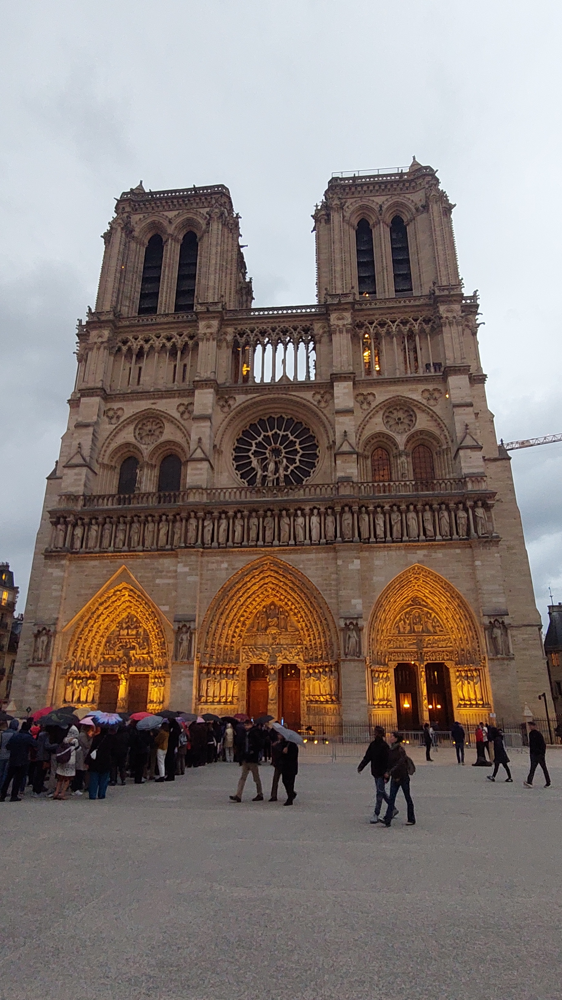

In [3]:
img = images[0]
img

In [4]:
M = np.array(img)
G = np.min(M[:,:,0:3], axis=2)

In [5]:
G

array([[206, 205, 204, ..., 234, 235, 236],
       [202, 201, 201, ..., 234, 235, 235],
       [205, 204, 201, ..., 234, 235, 235],
       ...,
       [115, 117, 112, ...,  91,  88, 100],
       [117, 114, 112, ...,  82,  85,  98],
       [112, 109, 109, ...,  73,  82,  99]],
      shape=(3264, 1836), dtype=uint8)

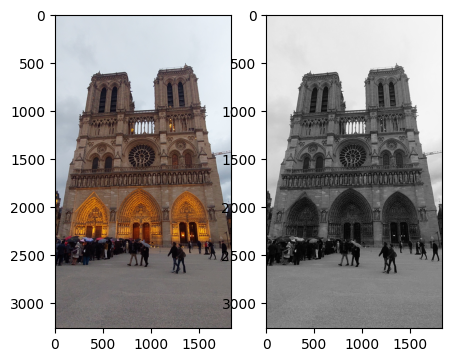

In [6]:
%matplotlib inline
fig = Figure(figsize=(5, 5))       # Construction d'une nouvelle figure
subplot = fig.add_subplot(1, 2, 1) # Ajout d'une zone de dessin à gauche
subplot.imshow(M)                  # Ajout de l'image à la zone de dessin
subplot = fig.add_subplot(1, 2, 2) # Ajout d'une zone de dessin à droite
subplot.imshow(G, cmap='Greys_r', vmin=0, vmax=255)  # Ajout de l'image
fig

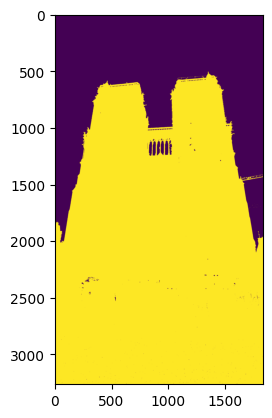

In [7]:
theta = 140
F = G < theta
plt.imshow(F)

In [8]:
get_filter(img, 140)

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]],
      shape=(3264, 1836))

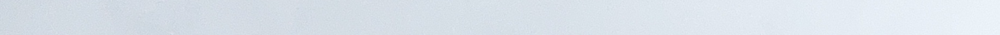

In [9]:
divided = divide_image(img, 50)
divided[2]

In [10]:
reduced = reduce_filtered_image(get_filter(divided[2], 140))

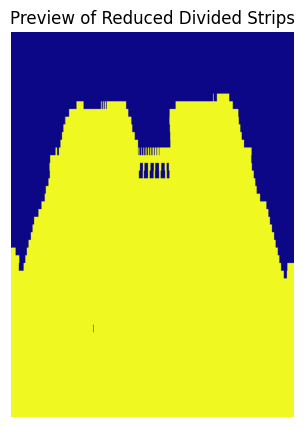

In [11]:
# Get the filtered and reduced arrays for each divided strip
reduced_strips = [reduce_filtered_image(get_filter(strip, theta)) for strip in divided]

# Make strips thicker by repeating each row, e.g., 10 times
thickness = 50
thick_strips = [np.repeat(row[np.newaxis, :], thickness, axis=0) for row in reduced_strips]
preview = np.vstack(thick_strips)

plt.figure(figsize=(10, 5))
plt.imshow(preview, cmap='plasma')  # Use a colorful colormap for better contrast
plt.title("Preview of Reduced Divided Strips")
plt.axis('off')
plt.show()

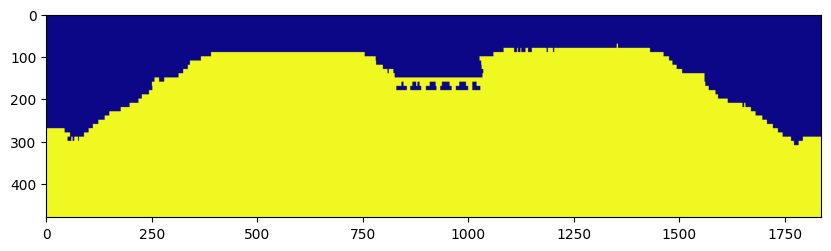

In [12]:
test_full = image_to_bool_map(img)
test_full_preview = np.repeat(test_full, 10, axis=0)  # Make it thicker for better visibility
plt.figure(figsize=(10, 5))
plt.imshow(test_full_preview, cmap='plasma')

In [ ]:
create_midi_from_bool_array(test_full, "test.mid")

IndexError: pop from empty list